# Python & Plotly Exercise :  AirBnb Singapore Data Visualization 

## Introduction

Airbnb, Inc. operates an online marketplace for lodging, primarily homestays for vacation rentals, and tourism activities. It is based in San Francisco, California. The platform is accessible via website and mobile app. Airbnb does not own any of the listed properties; instead, it profits by receiving commission from each booking. The company was founded in 2008 by Brian Chesky, Nathan Blecharczyk and Joe Gebbia. Airbnb is a shortened version of its original name, AirBedandBreakfast.com.It currently covers more than 100,000 cities and 220 countries worldwide, including Singapore.

Now we are going to look at Data AirBnb in Singapore.The data sourced from Kaggle.com and collected on 28 August 2019 according to the website.

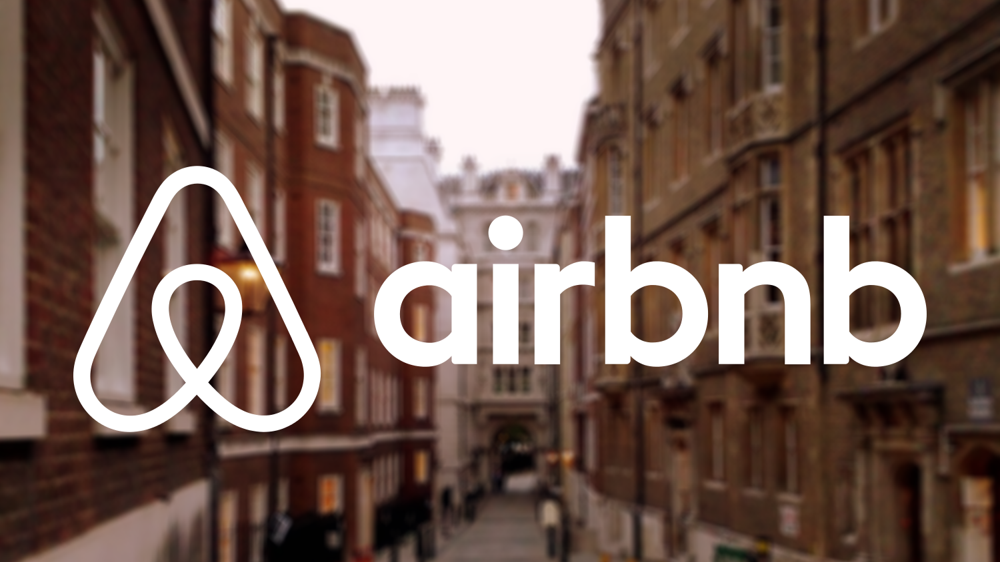

## Data Exploratory and Explanatory

Before we do the exploratory and explanatory data analysis, we will install all the library needed to support the data analysis.

In [2]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotnine import *

After we install the libraries, we call the data and check all the detail of the data.

In [3]:
air = pd.read_csv("listings.csv")
air.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


Now let us check first all the data type for each columns

In [4]:
air.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

If we look at above data types, the only data types that we need to change is the date data type in **last_review** column. I will add a column to change the date into monthly base and quarterly base.

In [5]:
air["last_review"] = air["last_review"].astype('datetime64')
air["last_review_month"] = air["last_review"].dt.to_period('M')
air["last_review_Q"] = air["last_review"].dt.to_period('Q')
air.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,last_review_month,last_review_Q
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365,2013-10,2013Q4
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365,2014-12,2014Q4
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365,2015-10,2015Q4
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353,2019-08,2019Q3
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355,2019-07,2019Q3


Now let us check the dimension of the data

In [6]:
air.shape

(7907, 18)

So we have 7907 rows and 18 columns.

Now let us check if the data has any missing values

In [7]:
air.isna().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
last_review_month                 2758
last_review_Q                     2758
dtype: int64

It seems like we have columns that has a lot of missing values. Now let's slice these columns.
We also will slice the row that has missing value

In [8]:
air1 = air.iloc[:,[1,3,4,5,6,7,8,9,10,11,14,15]]
air1.isna().sum()

name                              2
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

Now let us check which row that has missing value on its row

In [9]:
air1[air1.isna().any(axis=1)]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
1024,NaN,Audrey,Central Region,Bukit Merah,1.29108,103.83077,Private room,69,2,4,1,0
1331,NaN,Educator,Central Region,Bishan,1.35221,103.85148,Private room,650,1,0,1,0


In [10]:
air2 = air1.dropna(how='any')
air2

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,COZICOMFORT LONG TERM STAY ROOM 2,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2,365
1,Pleasant Room along Bukit Timah,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,1,365
2,COZICOMFORT,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2,365
3,Ensuite Room (Room 1 & 2) near EXPO,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,9,353
4,B&B Room 1 near Airport & EXPO,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,9,355
...,...,...,...,...,...,...,...,...,...,...,...,...
7902,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,31,61
7903,3bedroom luxury at Orchard,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,34,365
7904,[ Farrer Park ] New City Fringe CBD Mins to MRT,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,3,173
7905,Cheap Master Room in Central of Singapore,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,2,30


Now the data is ready. Let us check the summary of the data first

In [11]:
air2.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.00000,7905.000000,7905.000000
mean,1.314191,103.848789,169.284883,17.514105,12.81012,40.617710,208.779127
std,0.030577,0.043680,340.185801,42.099171,29.71099,65.140446,146.100788
min,1.243870,103.646560,0.000000,1.000000,0.00000,1.000000,0.000000
25%,1.295800,103.835830,65.000000,1.000000,0.00000,2.000000,54.000000
50%,1.311030,103.849410,124.000000,3.000000,2.00000,9.000000,260.000000
75%,1.322110,103.872560,199.000000,10.000000,10.00000,48.000000,355.000000
max,1.454590,103.973420,10000.000000,1000.000000,323.00000,274.000000,365.000000


If we look at summary above, seems like we have an outlier. If we take a look at price per night, we see that there is one tenant that has a really high price 10000. Let us check first if this data is true, then we will decide if this data will be drop or not. 

In [12]:
air2[air2["price"]==10000]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
2392,Comfortable & Quiet Master Bedroom,Yolivia,West Region,Bukit Panjang,1.34775,103.77181,Private room,10000,1,1,1,0
2978,YOUR entire PRIVATE LUXURY PENTHOUSE condo unit,Jj,West Region,Tuas,1.31909,103.64656,Entire home/apt,10000,2,5,1,89
5823,Testing,David,Central Region,Kallang,1.29610,103.86613,Private room,10000,1,0,1,0


So there are 3 rooms that have very high price. For now we will not drop this row.

## Visualization and Analysis

### Price

Now let’s take a look at the price distribution as per room types

In [13]:
fig = px.box(air2[air2["price"]<500], x="room_type", y="price", color="room_type"
                ,hover_data=["name","host_name","room_type","price"])
fig.show()



If we look at plot above, price for entire apt type is higher than other type

Now let’s take a look at the price distribution as per Neighboorhood Group

In [14]:
fig = px.box(air2[air2["price"]<500], x="price", y="neighbourhood_group", color="neighbourhood_group"
                ,hover_data=["name","host_name","room_type","price","neighbourhood_group"])
fig.show()



If we look at the graphic above, the price in the Central Region is averagely higher than other region. It is predictable since this region is the home for famous tourism spots in Singapore.

Since the price in Central Region is averagely high, Now let’s take a look at the price distribution in Central Region area.

In [15]:
test = air2[(air2["price"]<1000)& (air2["neighbourhood_group"]=="Central Region")]

fig = px.box(test, x="price", y="neighbourhood", color="neighbourhood"
                ,hover_data=["name","host_name","room_type","price","neighbourhood_group","neighbourhood"])

fig.show()




If we look at the plot above, all of the price listing in Southern Island and Marina South are higher than the average price in Central Region.

Now let us check the Top 10 host with the average highest price bookings

In [16]:
hostprice = air2.groupby("host_name").mean().loc[:,["price"]].sort_values("price",ascending=False).head(10)

fig = px.bar(hostprice,color="value",
            labels={'value':'Price in SGD'})

fig.show()


Based on the plot above, Yolivia’s listings are the most expensive listings in Singapore.

### Room Listings

Now we will take a look more detail on the room listings.

Let us check the population of the listings in every region in Singapore

In [17]:
region = air2.groupby("neighbourhood_group").count().sort_values("name",ascending=False).iloc[:,0]

fig = px.bar(region,color="value",
            labels={'value':'Number of Rooms'})

fig.show()



If we look at the plot above, the most populated listings in Singapore is in Central Region Area

Now let us check the population of the listings for every room type in Singapore

In [18]:
roomie = air2.groupby("room_type").count().sort_values("name",ascending=False).iloc[:,0]

fig = px.bar(roomie,color="value",
            labels={'value':'Number of Rooms'})

fig.show()

If we look at the plot above, the most listings in Singapore is with Entire home/apt type..

Let us check the availibility of rooms in a year in every region

In [19]:
fig = px.scatter(air2,x="neighbourhood_group",y="availability_365",animation_frame="room_type",color="neighbourhood_group",size="availability_365",
            hover_data=["name","host_name","room_type","price","neighbourhood_group","neighbourhood"])

fig.show()

Now let us check which host has the most number of listing. let us check the top 10



In [20]:
test4=air2.groupby("host_name").count().iloc[:,0:1].sort_values(by="name",ascending=False).head(10)

fig = px.bar(test4,color="value",
            labels={'value':'Number of rooms'})

fig.show()

Based on plot above, Jay has the most number of rooms.


### Mapping

Now let us take a look at map below to show the number of listings in Singapore, zoom in and hover to singapore region to check the detail

In [21]:

fig = px.scatter_geo(air2,lat="latitude",lon="longitude",
                     color="price",size="price",
                     hover_data=["name","host_name","room_type","price",
                                 "neighbourhood_group","neighbourhood"],scope="asia"
                    )

fig.show()